# Statistics, Distributions, Hypothesis Testing and Linear Regression

## Imports

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl # For colormap stuff later
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import sklearn.linear_model
import sklearn.metrics

## Random Variables and Distributions

### Random Variable
A random variable is some variable whose possible values are numerical outcomes of a random phenomemon.   
  
**Examples**:
- Outcome of rolling a die
- Height of students in a class
- Kinetic energy of a molecule in a gas
- Outcome of a coin flip if 0 for heads, 1 for tails (need numeric outcome)
- Number of times rolling a 1 before rolling a 6 on a die
  
  
**Types of Random Variables**:
- Discrete: A random variable is discrete if it can take on only a countable number of distinct values. Discrete random variables can be finite or infinite, but must take on distinct and seperable values. 
- Continous: A random variable which can take on any value within a given range (which can be infinite).

### Distributions

The probability density function (PDF) and the probability mass function (PMF) are functions which describe the probability of outcomes of a random variable. 
- The PMF is for discrete variables, and takes on values which equal the probability of an event. 
- The PDF describes probability by the area under its curve, so it must be integrated to find a probability.

  
**NOTE**: The probability of a continous random variable taking on any single value is 0. The probability of a tree being exactly 10m is 0, but you can find the probability of it being between 9.5m and 10.5m.  

## Populations and Samples

### <center>Population</center>
<center>The <u>entire group</u> you want to draw conclusions about</center>
<h3 align='center'>Sample</h3>
<center>A <u>subset of data</u> drawn from a population</center>

In general we will be working with samples, because we don't have access to an entire population. 

## Descibing a Sample

<font size=4><center>__Mode__: most likely value.
<font size=4><center>__Median__: 50% of observations will be greater than me, the other 50% will be lower
<font size=4><center>__Mean__: Over many observations, the sum divided by the number of observations is the mean
    
***

<font size=4><center>How "reliable" is the random variable?

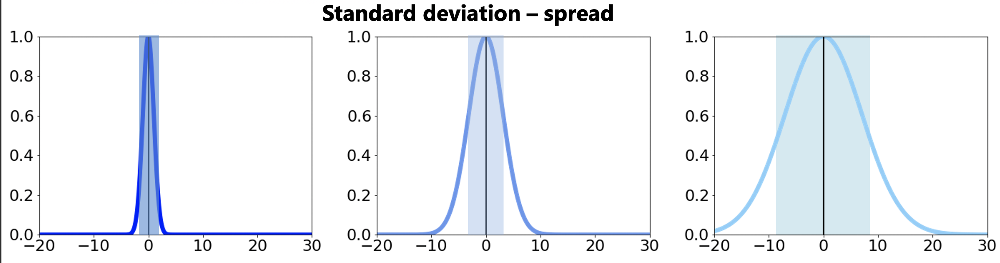

Mean ($\mu$)  
$\mu = \sum _{i=1}^{N}\frac{X_i}{N}$  

Standard Deviation ($\sigma$)  
$\sigma = \sqrt{\frac{\sum_i^N(X_i-\mu)^2}{N}}$  
  
Variance (var)  
$var=\sigma^2$

## Cumulative Distribution

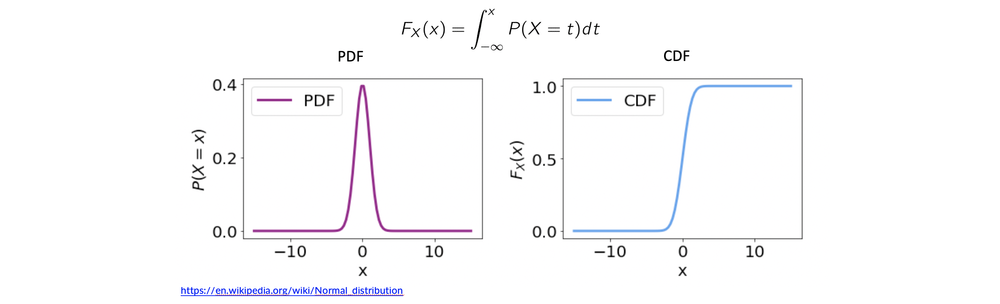

<font size=4>Each PDF has a CDF, which measures the probability that a random variable is __less than__ a particular value.

## Distributions in Python

In python we can use scipy.stats to represent the PDFs and CDFs of different distributions (and also PMFs for discrete distributions). scipy.stats has a lot of distrbibutions built in, but you can also define your own CDF and PDF.   

Let's use the standard normal aka gaussian as an example, but the syntax is the same for other distributions. 

In [2]:
gauss = stats.norm() # I imported scipy.stats as stats

In [3]:
# Get the value of a PDF at a single point
gauss.pdf(0)

0.3989422804014327

In [4]:
# Get the value of a CDF at a single point
gauss.cdf(0)

0.5

Lets plot the PDF and CDF of this function:

Text(0.5, 1.0, 'PDF of Standard Normal Distribution')

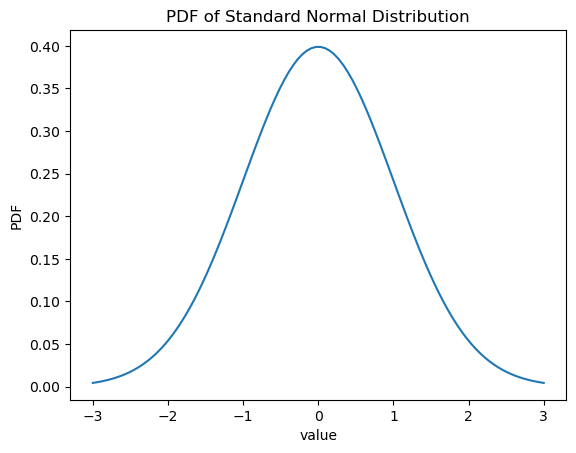

In [5]:
# Lets plot the PDF
fig, ax =plt.subplots()
x = np.linspace(-3,3, num=100)
ax.plot(x, gauss.pdf(x))
ax.set_xlabel('value')
ax.set_ylabel('PDF')
ax.set_title("PDF of Standard Normal Distribution")

Text(0.5, 1.0, 'CDF of Standard Normal Distribution')

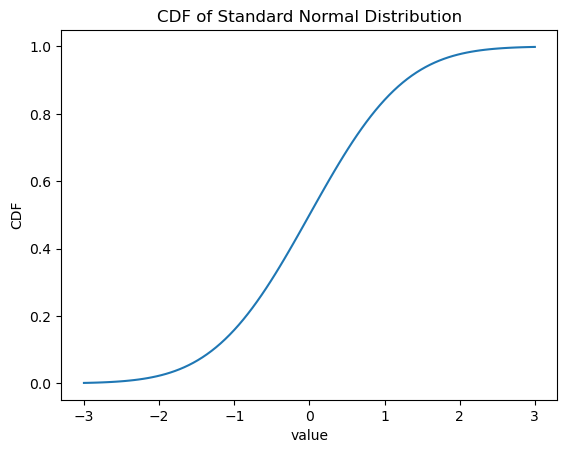

In [6]:
# Lets plot the CDF
fig, ax =plt.subplots()
x = np.linspace(-3,3, num=100)
ax.plot(x, gauss.cdf(x))
ax.set_xlabel('value')
ax.set_ylabel('CDF')
ax.set_title("CDF of Standard Normal Distribution")

We can also take samples from this distribution

In [7]:
sample = gauss.rvs(size=30) # Use rvs, meaning random variates, to sample this distribution

Text(0.5, 1.0, 'Sample from Standard Normal')

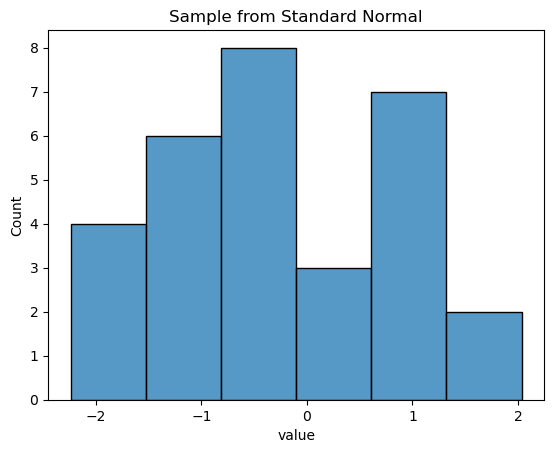

In [8]:
fig, ax = plt.subplots()
sns.histplot(sample)
ax.set_xlabel('value')
ax.set_title('Sample from Standard Normal')

<font size=4><center>__Notice how this histogram is not the same shape as the PDF...?__

## Example Distributions

<font size=4><center>__Each of the following distributions has an analytical function__ fully characterized by some number of parameters. 

### Normal/Gaussian Distribution
<font size=3>Fully characterized by two parameters: $\mu$ and $\sigma$. __We like to assume a lot of things are Gaussian__ in order to draw conclusions (more later!) which is not always a good choice

$$pdf(x)=\frac{1}{\sigma\sqrt{2\pi}}e^{-0.5\frac{x-\mu}{\sigma}}$$

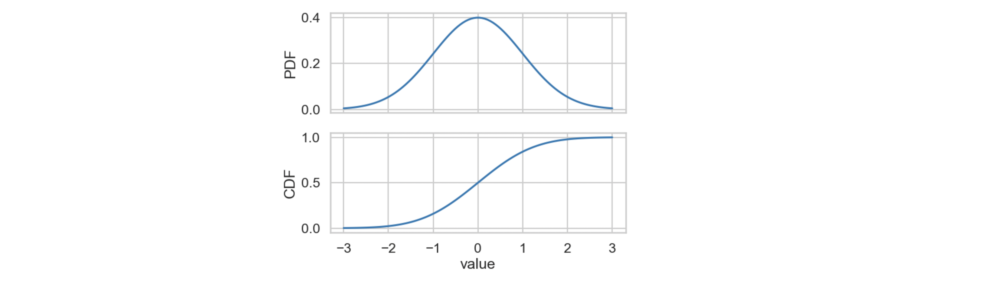

### Uniform Distribution

The uniform distribution has a constant probability density between a lower and upper bound.

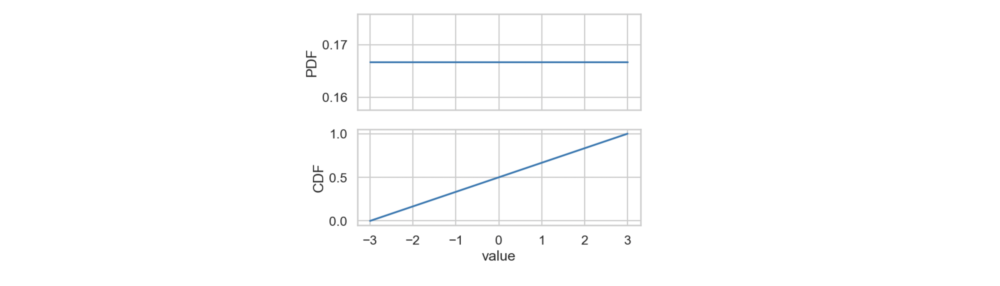

### Beta Distribution

Characterized by **four** parameters. The shape of this distribution is tunable, but it is used frequently in modeling distributions with bounded measurements. The distribution below has $pdf(x)=0$ for $x<0$ and $x>1$.

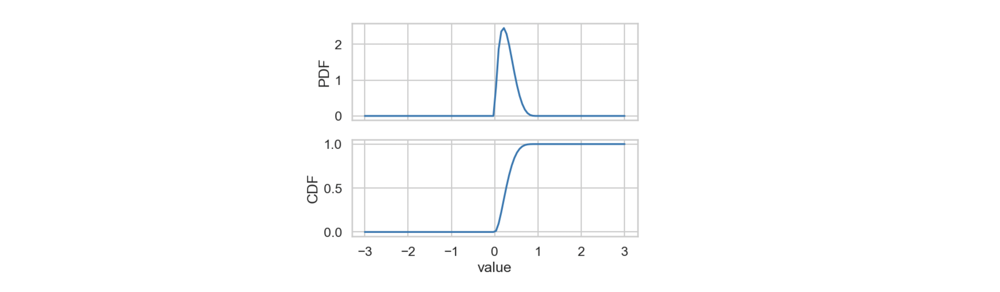

### Bernoulli distribution
Describes a discrete random variable with two possible values (such as the outcomes of a coin flip). 

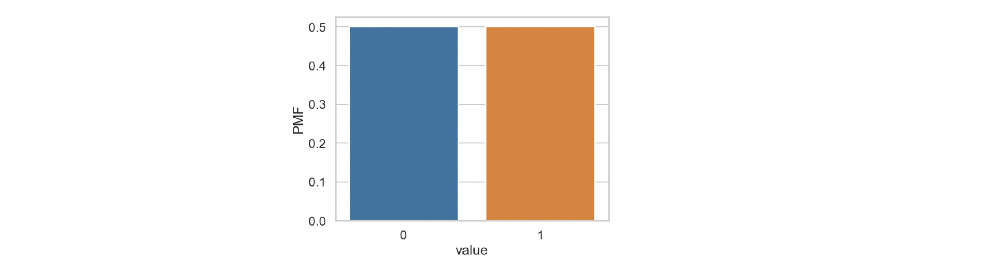

### Binomial Distribution

Describes the number of "successes" in a certain number of trials n, given that each success happens with probability p. This can be though of as a series of n Bernoulli trials, each with probability p.

Text(0.5, 1.0, 'PMF of Binomial')

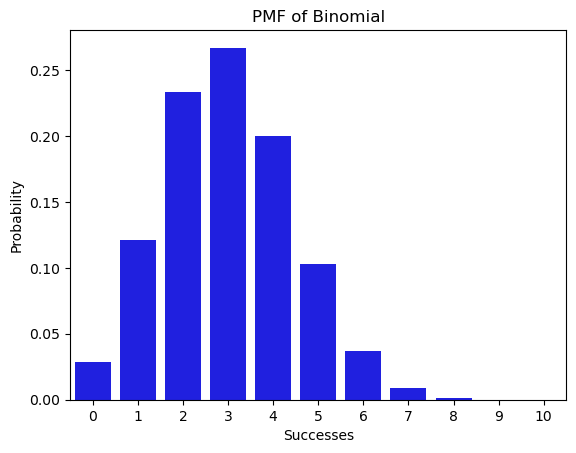

In [9]:
binom = stats.binom
x=list(range(11))
y=binom.pmf(x,n=10,p=0.3)
fig, ax = plt.subplots()
sns.barplot(x=x, y=y, ax=ax, color='blue')
ax.set_xlabel("Successes")
ax.set_ylabel("Probability")
ax.set_title("PMF of Binomial")

### Poisson Distribution
Discrete random variable seen often in physics and Markovian processes. Can be used to describe number of events that will occur in a given time frame. It is fully characterized by $\lambda$, which is both the mean and the variance.

  
For example, the number of cars that will drive over a certain spot on a highway in an hour.   
  
The time between events is described by an exponential distribution. 

Text(0.5, 1.0, 'PMF of Poisson')

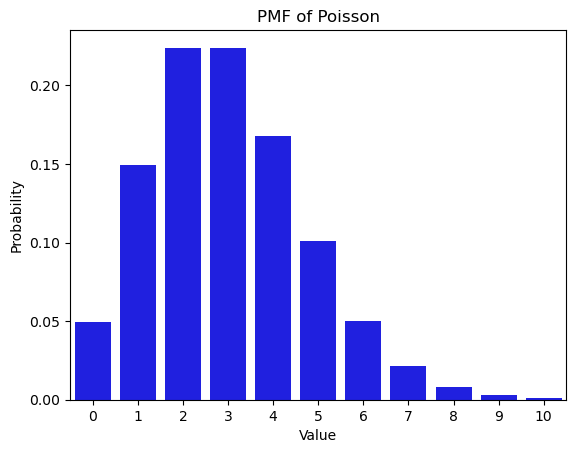

In [10]:
poisson = stats.poisson
x=list(range(11))
y=poisson.pmf(x,mu=3)
fig, ax = plt.subplots()
sns.barplot(x=x, y=y, ax=ax, color='blue')
ax.set_xlabel("Value")
ax.set_ylabel("Probability")
ax.set_title("PMF of Poisson")

### Exponential Distribution

The exponential distribution is a continous distribution which describe the time between events of a Poisson process. It is seen frequently in Markovian processes. 

Text(0.5, 1.0, 'PDF of Exponential Distribution')

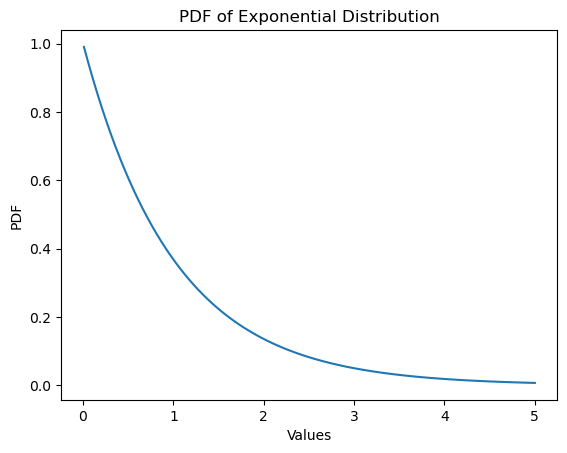

In [11]:
expo = stats.expon()
x=np.linspace(0.01, 5, 100)
y=expo.pdf(x)
fig, ax = plt.subplots()
sns.lineplot(x=x, y=y)
ax.set_ylabel("PDF")
ax.set_xlabel("Values")
ax.set_title("PDF of Exponential Distribution")

## Empirical distributions

We don't normally have the PDF, we only have a sample. Lets look at ways to get an empirical distribution from a sample. 

In [12]:
# Start with a sample from a normal distribution
norm_dist = stats.norm(loc=2, scale=1) # Loc is mean, scale is standard deviation
# Create x for plotting later
x = np.linspace(-3, 6, 300)

In [13]:
# Take a sample
sample = norm_dist.rvs(100)

A histogram is the empirical counts of our sample, and a way to look at the empirical distribution.

<Axes: ylabel='Count'>

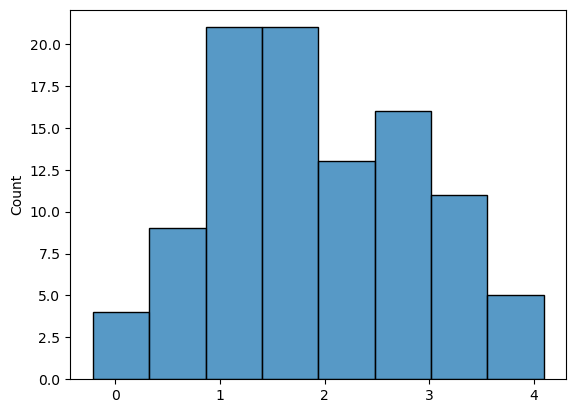

In [14]:
sns.histplot(sample) # Note how with a larger sample size, it looks more normal

What if we assume that our sample is a perfect representation of our population?

In [15]:
sample.mean()

1.9157628388734493

In [16]:
sample.std()

0.9837787286939131

This mean and standard deviation are not the same as our population!

#### Scipy let's us create PDFs from histograms.

What this actually does is creates an empirical CDF from the data, and interpolates and differentiates it. For more info [here](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.rv_histogram.html)

In [17]:
hist_data = np.histogram(sample)
empirical_dist = stats.rv_histogram(hist_data) # Create the scipy distribution

In [18]:
empirical_pdf = empirical_dist.pdf(x)

#### We can also use a kernel density estimate

This method estimates a continuous function from data samples by adding up many small functions until it matches the data

In [19]:
kde_dist = stats.gaussian_kde(sample)
kde_pdf = kde_dist(x)

#### Now we can plot these different distributions

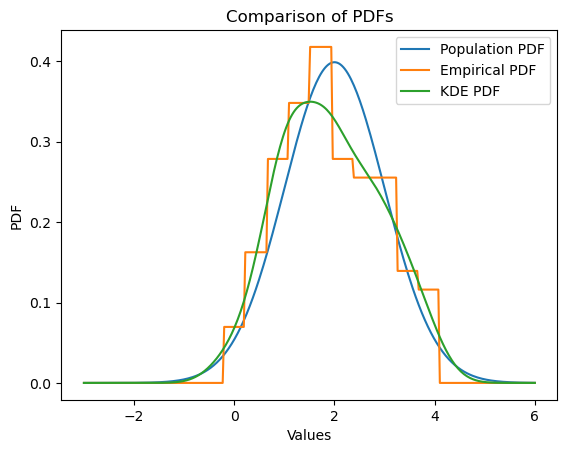

In [20]:
fig, ax = plt.subplots()
sns.lineplot(x=x, y=norm_dist.pdf(x),ax=ax, label="Population PDF")
sns.lineplot(x=x, y=empirical_pdf,ax=ax, label = "Empirical PDF")
sns.lineplot(x=x, y=kde_pdf, ax=ax, label="KDE PDF")
ax.set_xlabel("Values")
ax.set_ylabel("PDF")
ax.set_title("Comparison of PDFs")
ax.legend()

We can quantify the difference between two PDFs using the average difference between the functions

In [21]:
def pdf_difference(true_pdf_vector, estimated_pdf_vector):
    """Determines the mean absolute difference between true and estimated PDF functions"""
    return np.abs(true_pdf_vector-estimated_pdf_vector).mean()

In [22]:
print(f"The difference of the KDE is {pdf_difference(norm_dist.pdf(x),kde_pdf)}")
print(f"The difference of the Empirical PDF is {pdf_difference(norm_dist.pdf(x), empirical_pdf)}")

The difference of the KDE is 0.020277375539405902
The difference of the Empirical PDF is 0.02698302738423345


## Population from Samples
<font size=3>Can we draw conclusions about a population from a sample?

(-1.0, 1.0)

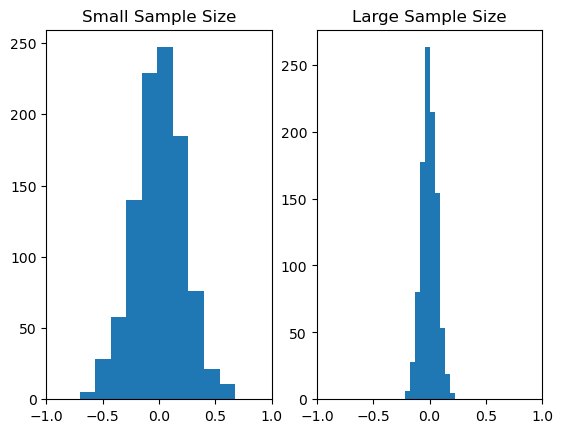

In [23]:
small_sample_res = np.zeros(1000)
large_sample_res = np.zeros(1000)
for i in range(1000):
    small_sample_res[i] = gauss.rvs(20).mean()
    large_sample_res[i] = gauss.rvs(200).mean()
fig, axes = plt.subplots(nrows=1, ncols=2)
axes[0].hist(small_sample_res)
axes[1].hist(large_sample_res)
axes[0].set_title("Small Sample Size")
axes[1].set_title("Large Sample Size")
axes[0].set_xlim(-1,1)
axes[1].set_xlim(-1,1)

<font size=4> As can be seen above, as the sample size gets larger, the distribution of the means gets tighter.

### Central Limit Theorem

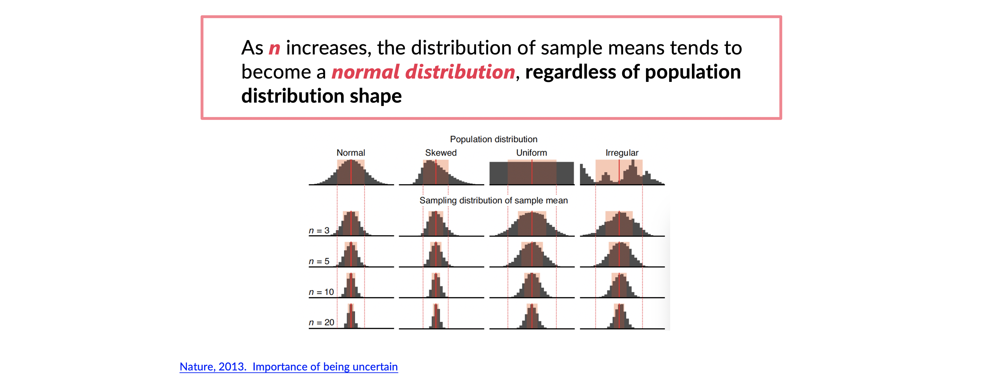

<font size=4><center>This tightening of the distribution of means is represented by a quantity called the __Standard Error__ (of the means):

$$SE=\sigma_\bar{\mu} = \frac{\sigma}{\sqrt{n}}\approx\frac{\sigma_X}{\sqrt{n}}$$

**NOTE:** The standard error represents the standard deviation of the **means** of a series of samples. The **sample standard deviation** is the standard deviation of a single sample.  

Normally, (unless we use bootstrapping), what we have access to is simply a single sample. The idea of the standard error, is that it is describing the distribution of means if we took more samples. We can use a single sample standard deviation to **estimate** the standard error, but can't find it exactly unless we know the population standard deviation. This approximation is why we need to use a t-distribution when the population standard deviation is unknown regardless of sample size.   

In [24]:
n = 1000
sample = stats.norm.rvs(size=n,loc=2, scale=1, random_state=777)

In [25]:
sample_mean = sample.mean()
standard_error = sample.std()/np.sqrt(n)

print(f'Sample mean: {sample_mean}, standard error: {standard_error}')

Sample mean: 2.032170464804657, standard error: 0.031734370816934684


<font size=4>__Thus, if we take a sample of size $n$ and std $\sigma_X$, we have an indication that we can be confident that the population mean $\mu$ is within $\sigma_\bar{\mu}$ of the sample mean $\bar{\mu}$__. Specifically, in this case, we are 95% confident that the true mean is within 0.06 of 2.03, and indead it is.

<font size=4><center> We call this a confidence interval - we __know__ the distribution that sample means take is a Gaussian, and we __know__ the PDF for the Gaussian distribution, so __we can compute the probability (confidence)__.

<font size=3><center>__NOTE__ that "there is a 95% chance that the true mean is within the interval" is an __incorrect__ interpretation. The true mean is a fixed number. Instead we are 95% confident that we have captured the true mean within the interval.

<font size=4> To find a confidence interval for a large sample, we use the central limit theorem. As sample size n gets large, the central limit theorem states that:  
$$\frac{\bar X-\mu}{\sigma / \sqrt{n}}\approx N(0,1)$$.   
    
Thus, (for a 95% confidence interval), we use the fact that for a standard normal  
$$Pr(-1.96 < \frac{\bar X -\mu}{\sigma / \sqrt{n}}<1.96)\approx 0.95$$  

Following a rearrangement this becomes:  
$$Pr(\bar X - 1.96 \frac{\sigma}{\sqrt{n}}<\mu<\bar X +1.96 \frac{\sigma}{\sqrt{n}})\approx 0.95$$
    
Thus, the 95% confidence interval is $\bar X \pm 1.96 \frac{\sigma}{\sqrt{n}}$  
    
However, we don't actually know $\sigma$, as it is a population parameter! We approximate it with the sample standard deviation:  
$$s=\sqrt{\frac{\sum_{i=1}^n(X_i-\bar X)^2}{n-1}}$$  
    
And the confidence interval becomes: $\bar X \pm 1.96 \frac{s}{\sqrt{n}}$    

In [26]:
# To calculate the value 1.96 from above, we use the inverse CDF function
# Which takes a percentile as an argument (like 0.95), and returns a value such that
# that proportion of the data is below that percentils
gauss = stats.norm(loc=0, scale=1) # Standard Normal
ci_prop = 0.95 # Desired confidence
# NOTE: Don't just want value such that 95% of values are below it, since we have two tails
# we actually want the value such that 97.5% are below it, (i.e. 2.5% are in the tail beyond it)
# This will make the range between -z and +z contain 95% of the data
z_prop = ci_prop+(1-ci_prop)/2
z = gauss.ppf(z_prop)
print(f"The critical value is {z:0.2f}")
print(f"So the confidence interval is ({sample_mean-z*standard_error},{sample_mean+z*standard_error})")

The critical value is 1.96
So the confidence interval is (1.969972240931426,2.094368688677888)


In [27]:
# Python will do all that for you as well
stats.norm.interval(confidence=0.95, loc = sample_mean, scale=standard_error)

(1.969972240931426, 2.094368688677888)

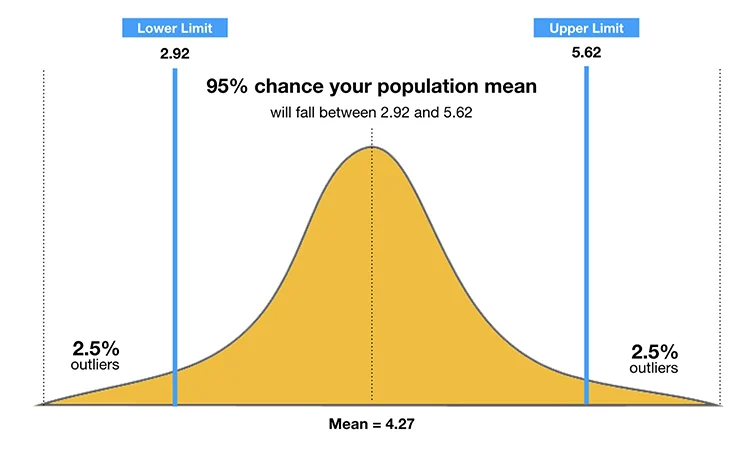

### Confidence Interval of the mean with t-statistic
<font size=4><center> *We need to make a slight modification to the above.* __The conceptual understanding should not change__. __Given the central limit theorem, if the sample size is small, the distribution of means isn't very Gaussian__. Because of this we use the "T" distribution to determine the confidence instead of the Normal distribution.

<font size=3> We can quickly calculate a confidence interval using one of these "t tests" in python

In [28]:
stats.t.interval(confidence=0.95, df=len(sample)-1, loc=sample_mean, scale=standard_error) 

(1.9698967932076026, 2.094444136401711)

<font size=3> Here, `confidence` is how confident we want to be, and `df` is degrees of freedom, which is the sample size minus one. __Thus, we are confident the mean is between 1.97 and 2.09__.

## Hypothesis Testing

Hypothesis testing is how we answer questions about data, you define two hypotheses (null and alternative) about the data, then use the p-value of a test statistic to determine if you can reject the null hypothesis or not. 

**Null Hypothesis**: A statement about a population parameter. This hypothesis is assumed to be "true" until proven otherwise. This is the default state. 

**Alternative Hypothesis**: A statement that directly contradicts the null hypothesis. This hypothesis is either accepted (if our tests show that the null hypothesis is very unlikely to generate the observed outcome), or not accepted (called failing to reject the null, if our tests show that the null hypothesis is not very unlikely to generate the observed outcome). 

**Examples**
1. Two factories produce batches of a chemical, and a QA engineer suspects that the qualities are different between the two factories.  
    a. Null Hypothesis: There is no different in quality between the two factories  
    b. Alternative Hypothesis: There is a difference in quality between the two factories
2. Health officials believe that smoking increases your risk of cancer.   
    a. Null Hypothesis: Smokers have the same or a lower rate of cancer as non-smokers.  
    b. Alternative Hypothesis: Smokers have a higher rate of cancer than non-smokers. 
3. Some people believe that red cars are ticketed for speeding more than other colors.  
    a. Null Hypothesis: Red cars are ticketed at the same rate as the general car population.  
    b. Alternative Hypothesis: Red cars are ticketed at a higher rate. 

In order to evaluate the truth of the alternative hypothesis, we examine a test statistic. A test statistic (denoted T) summarizes the extent to which our data are consistent with $H_0$. This test statistic is used to calculate a p-value, which is the probability of observing a value as extreme as that test statistic, **if the null hypothesis were true**. 

<font size=4>When testing hypothesis about the population mean, we use the z or t test statistics:  
$z=\frac{\bar x - \mu}{\frac{\sigma}{\sqrt{n}}}$ and $z=\frac{\bar x - \mu}{\frac{s}{\sqrt{n}}}$.  

<font size=4>They are very simmilar except the t-statistic uses the sample standard deviation, rather than the population standard deviation. Since we almost never know the population standard deviation, we mostly use the t-statistic. 

### t-test

<font size=3>The t-test makes use of the t-distrbution, which is simmilar to the Gaussian, except that it includes a parameter for degrees of freedom, which accounts for variations due to sample size. 

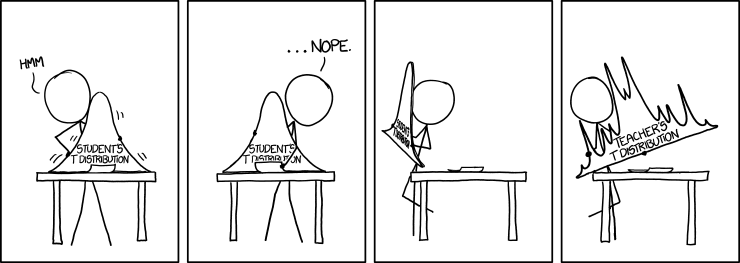

The t-distribution is sometimes referred to as Student's T-distribution, this is in reference to a pseudonym used by the creator of the t-distribution, and doesn't actually have anything to do with students, and techers. 

Text(0, 0.5, 'PDF')

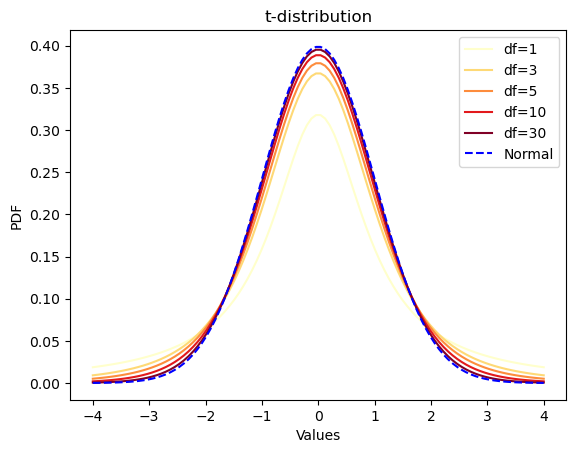

In [29]:
# Set up plot
fig, ax = plt.subplots()
# Set up x values
x = np.linspace(-4,4, 100)
# Create colormap (don't worry about this, its just for demonstration)
cmap = mpl.colormaps["YlOrRd"]

for index, dfreedom in enumerate([1,3,5,10,30]):
    color = cmap(index/4)
    ax.plot(x, stats.t.pdf(x, df=dfreedom, loc=0, scale=1), c=color, label=f"df={dfreedom}")
ax.plot(x, stats.norm.pdf(x, loc=0, scale=1), "b--", label="Normal")
ax.legend()
ax.set_title("t-distribution")
ax.set_xlabel("Values")
ax.set_ylabel("PDF")

<font size=3> As can be seen in the above plot, the tails of the t-distributions with lower degrees of freedom (and thus lower sample sizes) are thicker than the Normal distribution. This reflects the fact that at lower sample sizes, 

Lets look at the example in the HCEPDB data set of the small mass jsc values again. 

In [30]:
df = pd.read_csv('http://faculty.washington.edu/dacb/HCEPDB_moldata.zip').sample(10000)

In [31]:
popmean = df['jsc'].mean()
small_mass_sample = df.sort_values('mass')['jsc'].iloc[0:500]
random_sample = df.sample(500)['jsc']

Lets create the hypotheses,   
$H_0$: The small mass sample was drawn randomly from a population with mean = popmean  
$H_1$: The small mass sample was not drawn randomly from a population with mean = popmean. 

We can then calculate the t-statistic

In [32]:
t_stat = (small_mass_sample.mean()-popmean)/(small_mass_sample.std()/np.sqrt(500))

Now, we need to find the probability of having a t-statistic as extreme as the one we just calculated **assuming the null hypothesis is true**.   
   
   
To do this, we also need to decide whether we want to perform a one- or two-tailed test. 
If our alternative hypothesis is that the mean is less than the mean under the null hypothesis, this is a one-tailed test (or, if the alternative hypothesis is that the mean is greater than the mean under the null hypothesis, that is also a one-tailed test). On the other hand, if our alternative hypothesis is just that the mean is different (either less or more), then we would want to use a two-tailed test.   

In this case, our alternative hypothesis is just that the mean is different than that assumed in the null hypothesis, we want a two tailed test.   
  
  
We also need to determine what level of significance we want to test at, essentially the acceptable rate of wrongly rejecting the null hypothesis. For this, lets use the common 0.05. 

In [33]:
t_dist = stats.t(df=500-1,loc=0, scale=1)
abs_t_stat = np.abs(t_stat)
p_value = t_dist.cdf(-abs_t_stat)*2
print(f"The calculated p-value is {p_value}")
# This can be done in one line in python as well
scipy_p_value = stats.ttest_1samp(small_mass_sample, popmean=popmean, alternative='two-sided').pvalue
print(f"The value from scipy is {scipy_p_value}") # The same except for some floating point error

The calculated p-value is 7.149796274704309e-124
The value from scipy is 7.149796274704309e-124


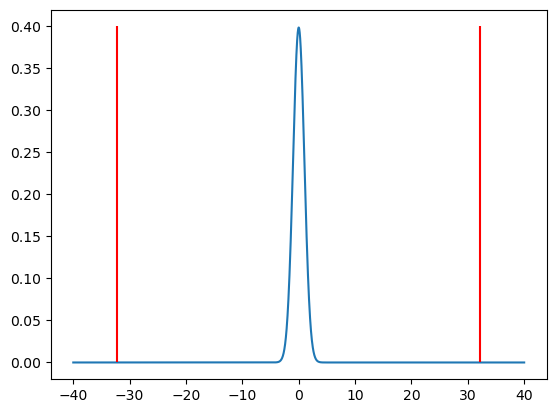

In [34]:
fig, ax = plt.subplots()
x = np.linspace(-40, 40, 3000)
y = t_dist.pdf(x)
ax.plot(x,y)
ax.vlines(x=[t_stat, -t_stat], ymin=0, ymax=0.4, colors='r') # Add verticle lines to show where t-statistic is

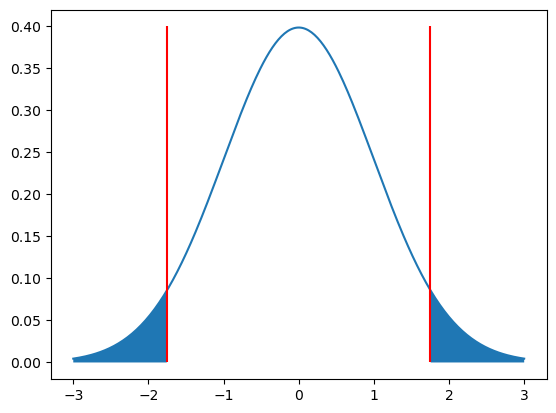

In [35]:
# This cell is the same as above, except I adjust the t-statistic to make it easier to 
# Visualize (this wouldn't have the same p-value, but is purely for the visual)
fig, ax = plt.subplots() 
x = np.linspace(-3, 3, 300)
y = t_dist.pdf(x)
ax.plot(x,y)
t_stat = 1.75
ax.vlines(x=[t_stat, -t_stat], ymin=0, ymax=0.4, colors='r')
low_x = np.linspace(-3, -t_stat, 100)
high_x = np.linspace(t_stat, 3, 100)
ax.fill_between(x=x,y1=y, where=(x<-t_stat) | (x>t_stat))

### Two-sample t-Test

<font size=3>What we did above was test (up to 95% confidence) __whether the sample was drawn from the known distribution randomly__. It confirmed that the small mass sample was indeed NOT chosen randomly (it was chosen based on the mass of the material), thus it failed the test.

<font size=3> As mentioned previously, you can have different alternatives, either two tailed or one tailed, depending on the question we want to answer.  

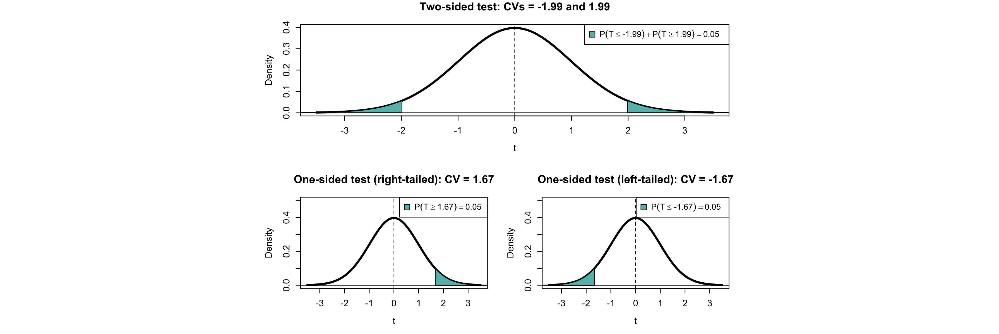

https://bookdown.org/content/50a3178d-5432-44a3-bb5c-1718ca3e1fe2/3.2-one-sided-vs-two-sided-tests.html

<font size=3> But what if instead, we wanted to know if two samples came from the same population or were different?

In [36]:
stats.ttest_ind(small_mass_sample, random_sample, alternative='two-sided', equal_var=True)

Ttest_indResult(statistic=-17.68318608588589, pvalue=4.4145849579860494e-61)

<font size=3> From the p-value, we can determine that it is very unlikely that the two samples were drawn randomly from the same distribution, indeed they were not!

<font size=3>Note that with `equal_var=True` we assume that the two samples come from a population with equal variance. If you use `False` you are instead doing [Welch's t-test](https://en.wikipedia.org/wiki/Welch%27s_t-test), which is out of scope for this class. 

<font size=4> From a modelling perspective, could the small mass data be used to create a model to predict JSC that we expect to do well for larger mass data?

## Parametric vs Non-parametric tests

<font size=3>Though a t-test is very useful, it does assume that the statistic you are estimating follows a t-distribution when sampled.   
  
<font size=3>If your statistic is the mean, that's a good assumption due to the central limit theorem. **But if your statistic doesn't follow a t-distribution?**

### Tests defined on other distributions

#### __$\chi^2$ test for standard deviations__

<font size=3> For sample standard deviations, they follow a chi-squared distribution. This distribution can thus be used for finding confidence intervals and hypothesis tests for standard deviations. More info [here](https://www.itl.nist.gov/div898/handbook/eda/section3/eda3666.htm).

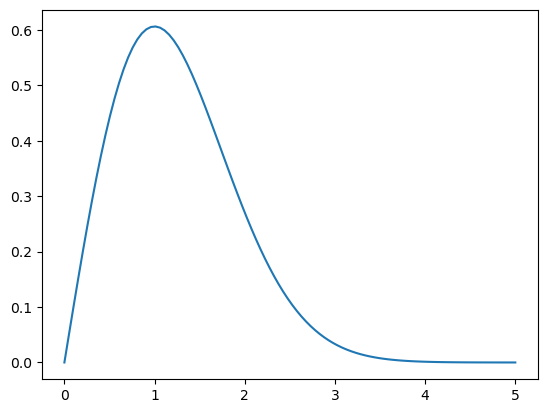

In [37]:
chi_dist =stats.chi(df=2)
fig, ax = plt.subplots()
x = np.linspace(0,5, 100)
y= chi_dist.pdf(x)
ax.plot(x,y)

#### **Binomial test**

<font size=3> If you are examining the number of successes in a series of trials, you might use a [binomial test](https://www.real-statistics.com/binomial-and-related-distributions/hypothesis-testing-binomial-distribution/)

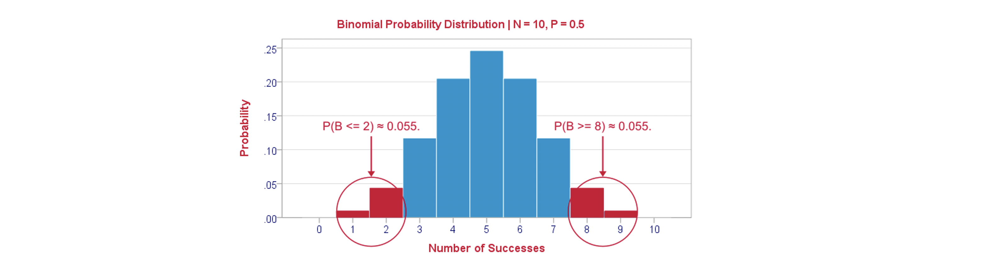

https://www.spss-tutorials.com/binomial-test/

<font size=3> t, $\chi^2$, binomial and all other tests that use a known analytical distrbution assume that the **statistic you are interested in follows that distribution**. These are called parametric tests, because they use assumed distribution parameters. 

- <font size=3> If you use a parametric test, and the assumption is wrong, you confidence level is not meaningful. 
- <font size=3> If you are not sure what distribution a sample statistic takes, you can't really use a parametric test.

### Bootstrapping

<font size=3> What if we want to estimate the 10th percentile for the LUMO-HOMO gap, and calculate a confidence interval for it? The 10th percentile doesn't follow any of the distributions that we know, what if we try resampling to examine the distribution? 

In [38]:
# Take 100 samples of size 100, and find the 10th percentile for each
percentile_samples = np.zeros(100)
for i in range(100):
    percentile_samples[i] = np.percentile(df.sample(100)["e_gap_alpha"], q=10)
    

<Axes: ylabel='Count'>

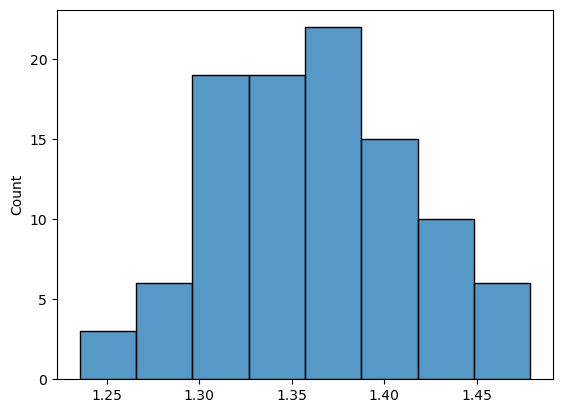

In [39]:
sns.histplot(percentile_samples)

<font size=3> For photovoltaic materials, we often want the LUMO-HOMO energy gap to be a low as possible. What if we are making new solar materials in the same way HCEPDB did for exploration. __How confident are we that at least 1/10 of the materials have an energy gap less than 1.3eV?__

In [40]:
percentile_distr = stats.gaussian_kde(percentile_samples)
prob = percentile_distr.integrate_box(-np.inf, 1.3)

In [41]:
print(f"The probability that the true 10th percentile is less than 1.3 is {prob}")

The probability that the true 10th percentile is less than 1.3 is 0.1391088399074644


So we aren't very confident that the true 10th percentile is less than 1.3. 

<font size=5><center>__This is called bootstrapping, and we can do it with any statistic.__

<font size=4> Scipy has bootstrapping builtin, but it is only two sided

In [42]:
def statistic_of_interest(data, axis):
    return np.quantile(data, 0.1, axis=axis)
boot_results = stats.bootstrap(
    (df.sample(1000, random_state=5)["e_gap_alpha"].to_numpy().reshape(-1, 1),),
    statistic_of_interest,
    n_resamples=100,
    batch=5,
    confidence_level=0.96)
print('Interval: (',boot_results.confidence_interval,")")

Interval: ( ConfidenceInterval(low=array([1.33096657]), high=array([1.41340357])) )


<font size=4>This method is non-parametric in that __we made no assumptions about the statistic distribution__

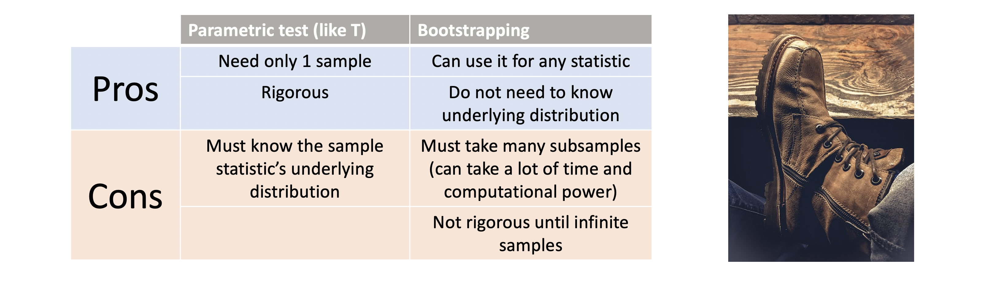

## Linear Regression

<font size=3> In supervised machine learning, we use **features** (machine learning name for independent variables) to predict some **target** (dependent variable).   
    
<font size=3> The reason we may want to do this is because the target might be "expensive" to find, but the "features" are easier to obtain, so if we are able to predict the "expensive" target based on the "cheaper" features.   
    
<font size=3> When the target is continous, we call the task of predicting it from features **regression**, and when the target is discrete (and finite) we call it **classification**.   
    
<font size=3> One of the simplest models we can use for regression is a linear model, where the target is a linear combinations of the features, plus some intercept.  
    
<font size=3> When using a single feature to try to predict the target, this is called simple linear regression, and it takes the form:
    $$\hat f (x_0) = w \cdot x_0 +b$$

<font size=3> where w is the slope, b is the intercept,(which can also be written as $\beta_1$ and $\beta_0$ respectively) and $x_0$ is our feature. In machine learning, the slope in general is called the "weight", and the interept is called the "bias" (related to, but not identical to the bias variance tradeoff we discussed previously. 

<font size=3> To find the values of w, and b we minimize the prediction error (residual sum of squares)
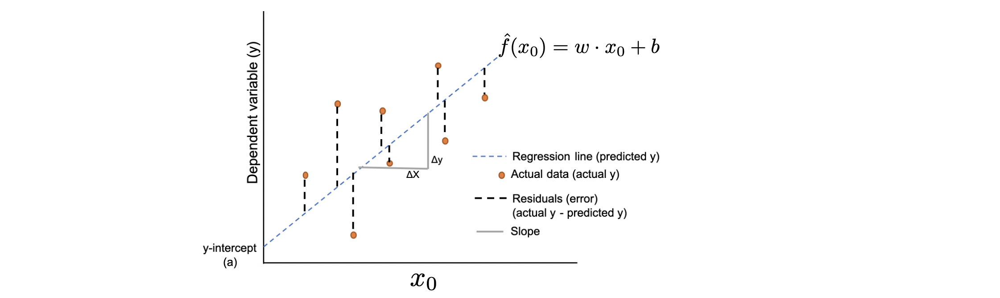

https://www.reneshbedre.com/blog/linear-regression.html

<font size=3> Fortunately, there is actually an analytical solution to finding these solutions! 
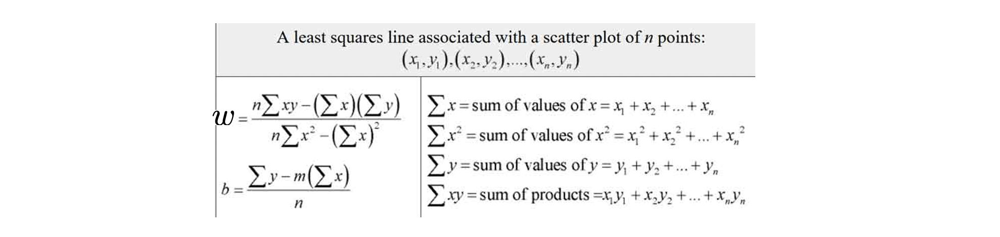
    
https://giasutamtaiduc.com/line-of-best-fit-formula.html  
    
_Note_: If you would like to see the derivation of these formulas in the general case, with n features, [here](https://towardsai.net/p/machine-learning/linear-regression-complete-derivation-with-mathematics-explained) is one only using calculus.   
      
  
Additionally, The elements of statistical learning : data mining, inference, and prediction by Trevor Hastie has a derivation using matrix calculus, and is available through the [UW Library](https://orbiscascade-washington.primo.exlibrisgroup.com/discovery/fulldisplay?docid=alma99123609260001452&context=L&vid=01ALLIANCE_UW:UW&lang=en&search_scope=UW_EVERYTHING&adaptor=Local%20Search%20Engine&tab=UW_default&query=any,contains,elements%20of%20statistical%20learning) as an ebook. 

<font size=3> You can technically calculate these values by hand...but in general don't. Instead, we will make use of scikit-learn!

<font size=3> Let's go through an example using JSC vs E Homo Alpha. 

In [43]:
# First, get the column from the dataframe (df["jsc"])
# Then, convert it to numpy using the to_numpy method (this is so we can create a column vector)
# Convert the row vector (a 1xn numpy array) into a column vector (nx1 numpy array)
# using numpy's reshape method. The first argument is the shape you want in a tuple
# It is in the form of (rows, columns), and you can use -1 to let numpy figure out how 
# big that dimension needs to be to hold the data. In this case I want a column vector,
# so I only want 1 column, so the columns is 1, but I don't want to figure out how many
# rows I need to make that happen, so I use -1 for the rows. 
x = df["jsc"].to_numpy().reshape((-1, 1)) 
# Repeat to the y
y = df["e_lumo_alpha"].to_numpy().reshape((-1,1))

In [44]:
# The next step is to create a linear regression object
regressor = sklearn.linear_model.LinearRegression() 
# Then, use the fit method to fit the regressor
regressor.fit(x,y)
print(f"The slope for this regression is {regressor.coef_[0]}")
print(f"The intercept for this regression is {regressor.intercept_}")

The slope for this regression is [-0.0030261]
The intercept for this regression is [-2.93287941]


<font size=3>Alright, so now we can perform a linear regression! Lets plot the results and see how well they match the data

(0.0, 350.0)

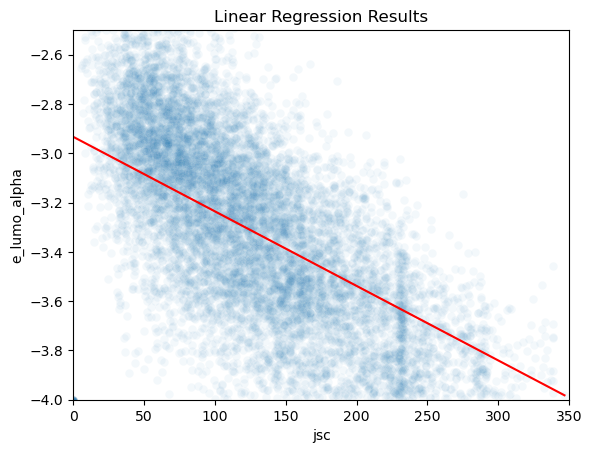

In [45]:
fig, ax = plt.subplots()
predicted_values = regressor.predict(x) # Use the regressor to get predictions based on x
sns.scatterplot(data=df, x="jsc", y="e_lumo_alpha", alpha=0.05, ax=ax) # Plot the jsc and e_lumo_alpha
# Above I used alpha, which sets the transparancy, so its easier to see overlapping data
sns.lineplot(x=x.flatten(), y=predicted_values.flatten(), ax=ax, color='r') # Plot the regression results
# I used .flatten() above to change the column vectors into 1-dimensional arrays (since that is what matplotlib/seaborn expects here)
ax.set_title("Linear Regression Results") # Set the title
ax.set_ylim(-4,-2.5) # Set the y-axis min and max
ax.set_xlim(0, 350) # Set the x-axis min and max

<font size=4> So we have fitted the best linear model! Great, we now have a perfect model right? ....right?

<font size=4> Well not really, the data is spread really far from the regression line, and looking at the graph it doesn't look like the linear model really captures the relationship between the e_lumo_alpha and jsc. 
    
<font size=4> Let's examine how good the fit is.
    
<font size=3> One metric for this is the $R^2$ score, which measures how much variation in the target is explained by the model. It varies between 0 and 1, with 0 being equivalent to just guessing the mean for each prediction, and 1 being a perfect predictor. 
    
$$R^2 = 1 - \frac{RSS}{TSS}$$  
where  
$$RSS = \sum_i^N(y_i-\hat y_i)^2$$
$$TSS = \sum_i^N(y_i - \bar y_i)^2$$

In [46]:
# Find the r2 score
sklearn.metrics.r2_score(y_true=y, y_pred=predicted_values)

0.2683923272322185

<font size=4> This $R^2$ score shows that the model doesn't do a great job at predicting `e_lumo_alpha`. There are a couple of different reasons for this:  
    
<font size=4>1. The underlying data isn't linear  
    
<font size=4>2. There are other features that we should include (both ones that we have, and ones that we don't) 
    
<font size=4>3. There are missing values that are leading to errors in the regression

<font size=4> We can use the seaborn regplot to explore another model, namely a quadratic regression. Documentation for this function is [here](https://seaborn.pydata.org/generated/seaborn.regplot.html). 
    
<font size=4> In order to perform quadratic regression, you basically perform a linear regression but add features which are the squares (or cubes, etc.) of your current features, and add them into the regression. Essentially performing the linear regression, including both $x$, and $x^2$ as features.  

(0.0, 300.0)

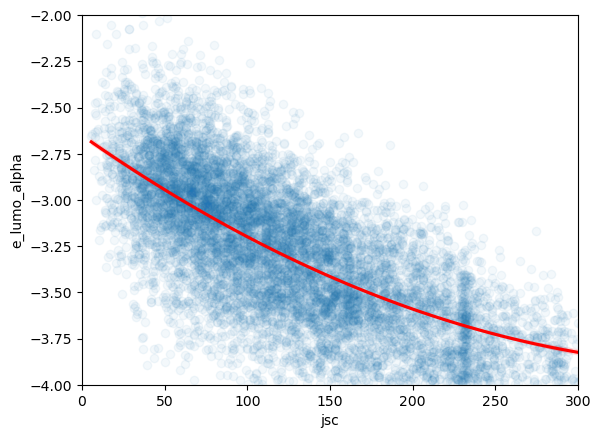

In [47]:
fig, ax = plt.subplots()

filtered_data = df[~np.isclose(df["jsc"],0)]
# We can use the seaborn regplot function so 
sns.regplot(data=filtered_data, x="jsc", y="e_lumo_alpha", order=2,
           scatter_kws = dict(alpha=0.05), line_kws = dict(color="red"),
           ax=ax)
ax.set_ylim(-4, -2)
ax.set_xlim(0, 300)

<font size=4> Although a more complicated model can fit the data better, we should be careful of overfitting!

(0.0, 300.0)

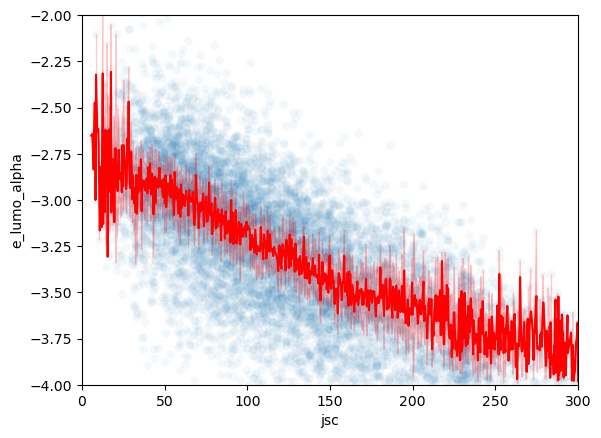

In [48]:
fig, ax = plt.subplots()

sns.scatterplot(data=filtered_data, x="jsc", y="e_lumo_alpha",
           ax=ax, alpha=0.05)
sns.lineplot(data=filtered_data.sort_values(by="jsc"), x="jsc", y="e_lumo_alpha",
             ax=ax, color="red")
ax.set_ylim(-4, -2)
ax.set_xlim(0, 300)

### Error/Accuracy Metrics

<font size=4> Here are some possible metrics to use for evaluating regression models:

#### <center>Mean Squared Error (MSE)
<font size=3> $$MSE = \frac{1}{N}\Sigma_i^N(y_i-\hat{y}_i)^2$$
  
#### <center> Mean Absolute Error (MAE)

<font size=3>More unstable than MSE but also more interpretable.  
<font size=3> $$MSE = \frac{1}{N}\Sigma_i^N|y_i-\hat{y}_i|$$  
    
#### <center> R2 score

<font size=3>1.0 is a perfect predictor, 0.0 is guessing the mean.
    
<font size=3> $$R2 = 1-\frac{RSS}{TSS}$$
    
<font size=3>Where  
<font size=3> $$RSS = \Sigma_i^N(y_i-\hat{y}_i)^2$$
    
<font size=3> $$TSS = \Sigma_i^N(\bar{y}-\hat{y}_i)^2$$

## A word of Caution
<font size=4> Blindly applying linear regression can lead you to miss things

<center><img src = attachment:a5792cdc-27e7-4718-8cba-688ba6aed0e9.png alt="Simpson's Paradox" width=600>
<center><img src = attachment:b47c01c5-526e-456c-884c-957220031edb.png alt="Anscombe's Quartet" width =600>
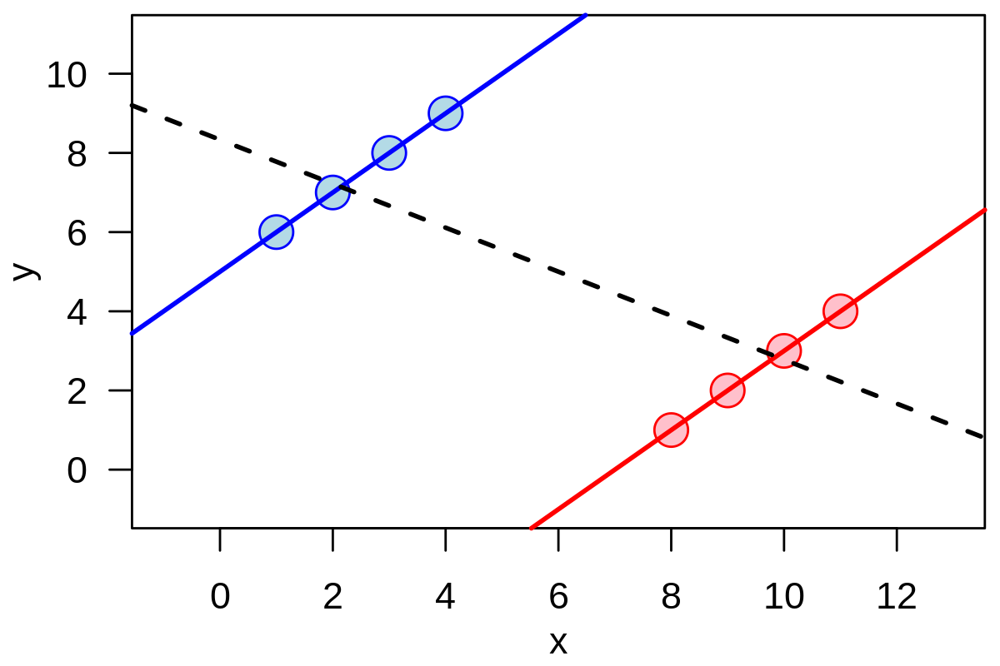
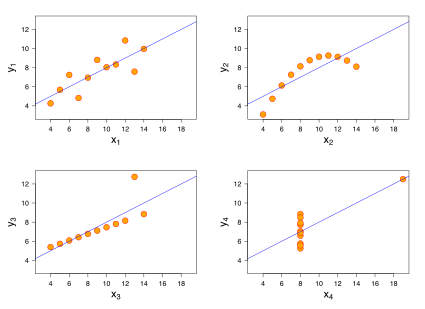

## Excercises:

1. Using the `pdf_difference` function from above, as well as a method for finding the empirical PDF (Histogram or KDE), plot the difference between the true and sample PDFs as a function of sample size.

2. What are the Null and Alternative Hypothesis for these possible tests:  
    a. You want to test whether a new coating will perform better than the current method at reducing the build up of ice on airplane wings.   
    b. A researcher has developed a new drug treatment for Tuberculosis, and wants to test whether it performs better than the current standard of care.   
    c. A doctor wants to test whether people who drink pepsi, and those who do not have different life expectancies.   

3. Draw a high mass voc sample, and a low mass voc sample from the HCEPDB data (take the voc for the 500 materials with the highest mass and lowest mass respectively. Use a two-sample t-test to check if these two samples were likely drawn from the same distribution. 

4. Take different sample sizes from the HCEPDB data, (size=10,30,100), and perform a 1-sample t-test with each to test if the population mean is greater than 0.8.  
    a. What is the null and alternative hypothesis?  
    b. What is the true population mean?   
    c. What is the p-value for the t-test for each sample?  

5. Take a sample of size 100 from the HCEPDB data. Then use bootstrapping to test if the median of pce in the population is greater than 3.8. 

6. Perform a linear regression with target=`e_lumo_alpha`, and feature=`pce`